Tao Peng 
UZH ID: 21-738-927

# 3.2 Network Analysis


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import networkx as nx
import graphviz

try:
  import pygraphviz
except ModuleNotFoundError as e:
  # # To install pygraphviz on Google Colab if not already yet
  !apt-get install graphviz graphviz-dev
  %pip install pygraphviz
  import pygraphviz

try:
  import geopandas
except ModuleNotFoundError as e:
  # # To install pygraphviz on Google Colab if not already yet
  %pip install geopandas
  import geopandas as gpd

## 3.2.0. Data Exploration & Pre-processing

In [2]:
# load data
ny_street = pd.read_csv('newyork_street.csv')
zh_street = pd.read_csv('zurich_street.csv')

# while segments have the same pair of nodes, keep only the one with shorter distance
# Zurich
zh = zh_street.sort_values(by='seg_length') # sort by 'seg_length' in ascendent manner
zh = zh.drop_duplicates(subset=['s', 'e'], keep="first") # keep only the one with shortest distance
# NewYork
ny = ny_street.sort_values(by='seg_length') 
ny = ny.drop_duplicates(subset=['s', 'e'], keep="first")

In [3]:
# Zurich
print('ZH dataframe:')
print(zh.head())
print()
print('ZH summary:')
print(zh.describe())
print()

# NewYork
print('NY dataframe:')
print(ny.head())
print()
print('NY summary:')
print(ny.describe())

ZH dataframe:
       FID      osmid           s           e  seg_length
2017  2017   58691529  9656176368   727286390    0.275575
1820  1820  332455397  1852219833    92492373    0.622628
1553  1553   28908903  5723286876    30795385    0.643784
990    990  147759333  4909101538  1609407584    0.812168
438    438  543698051  9705210239  5255884007    0.918376

ZH summary:
               FID             s             e   seg_length
count  2079.000000  2.079000e+03  2.079000e+03  2079.000000
mean   1041.866763  5.651732e+09  3.824450e+09    26.382604
std     601.716583  3.638621e+09  3.506313e+09    28.435256
min       0.000000  2.611448e+07  2.611448e+07     0.275575
25%     520.500000  1.721058e+09  3.563114e+08     6.938488
50%    1043.000000  5.679623e+09  3.283501e+09    15.365981
75%    1562.500000  9.633153e+09  5.777114e+09    36.600543
max    2083.000000  9.750284e+09  9.706186e+09   302.172930

NY dataframe:
       FID       osmid           s           e  seg_length
5922  5922 

## 3.2.1. Create street graphs and dual graphs (5 pts)

In [4]:
# define a function to draw networks
def draw_nx(g, pos = None, ax = None, figsize = None, title = None, node_color = None,\
            cmap = None, node_size = None, edge_color = None, vmin = None, vmax = None):

  if ax == None:
    plt.figure(figsize=(8,5) if figsize == None else figsize)
  else:
    ax.set_title(title)

                 # g: a networkx graph, pos: a dictionary with nodes as keys and positions as values
  return nx.draw(g, alpha = 0.5, ax = ax, node_color = node_color, edge_color = edge_color, \
                 pos = nx.nx_agraph.graphviz_layout(g, prog = 'neato') if pos == None else pos, node_size = 20 \
                 if node_size == None else node_size, cmap = cmap, vmin=vmin, vmax=vmax)

### Task 1: create undirected weighted street graph
+ the intersections of street segments are the nodes of the graph
+ the street segments are the edges of the graph
+ the length of a street segment is the weight of the corresponding edge

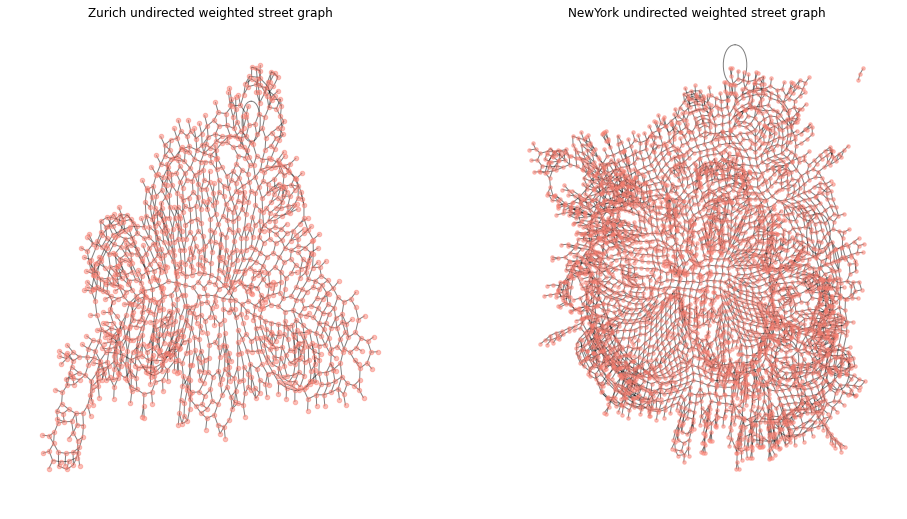

In [ ]:
fig, ax = plt.subplots(1,2, figsize = (16, 9))

# Zurich undirected weighted street graph
weighted_edge_list_zh = zh.iloc[:, -3:].to_numpy() # load last 3 columns of the ZH df as (starting_node, ending_node, weight)
G_zh = nx.Graph()
G_zh.add_weighted_edges_from (weighted_edge_list_zh) # add weight
draw_nx(G_zh, title = 'Zurich undirected weighted street graph', ax = ax[0], node_color = 'salmon') 

# NewYork undirected weighted street graph
weighted_edge_list_ny = ny.iloc[:, -3:].to_numpy() # load last 3 columns of the ny df as (starting_node, ending_node, weight)
G_ny = nx.Graph()
G_ny.add_weighted_edges_from (weighted_edge_list_ny) # add weight
draw_nx(G_ny, title = 'NewYork undirected weighted street graph', ax = ax[1], node_color = 'salmon', node_size= 12)

### Task 2: create dual graphs
+ the nodes are the edges
+ the edges are the nodes in the street graphs. 
+ our dual graphs should be undirected unweighted graphs

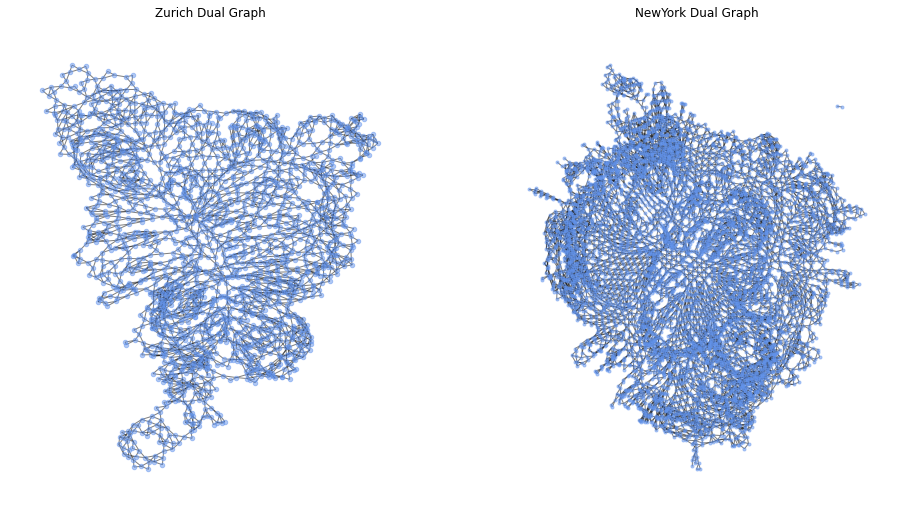

In [ ]:
fig, ax = plt.subplots(1,2, figsize = (16, 9))

# Zurich dual graph
unweighted_edge_list_zh = weighted_edge_list_zh[:, :-1] # discard weight,'segment_lenth'
G_zh_unweighted = nx.Graph()
G_zh_unweighted.add_edges_from(unweighted_edge_list_zh)
L_zh = nx.line_graph(G_zh_unweighted) # The line graph of a graph G has a node for each edge in G and an edge joining those nodes if the two edges in G share a common node
draw_nx(L_zh, title = 'Zurich Dual Graph',node_color = 'cornflowerblue', ax = ax[0])

# NewYork dual graph
unweighted_edge_list_ny = weighted_edge_list_ny[:, :-1] # discard weight, 'segment_lenth'
G_ny_unweighted = nx.Graph()
G_ny_unweighted.add_edges_from(unweighted_edge_list_ny)
L_ny = nx.line_graph(G_ny_unweighted)
draw_nx(L_ny, title = 'NewYork Dual Graph',node_color = 'cornflowerblue', node_size = 9, ax = ax[1])

## 3.2.2. Centrality calculation of the graphs (15 pts)
+ We will use degree, closeness, and betweenness.
+ For the street graphs, you need to calculate two sets of centralities: One uses the segment length as the edge length, and one only takes the topology of the network that treats all edge lengths as 
+ For the dual graphs, you need to calculate one set of the centralities.

In [9]:
# define a function to calculate degree & closeness & betweenness centrality
def cal_centrality(graph, weight = None):
    # calculate the degree centrality
    d_c = [j for i, j in nx.degree_centrality(graph).items()]
    # calculate the closeness centrality
    c_c = [j for i, j in nx.closeness_centrality(graph, distance = weight).items()]
    # calculate the betweenness centrality
    b_c = [j for i, j in nx.betweenness_centrality(graph, weight = weight).items()]
    # return a list of degree & closeness & betweenness
    return [d_c, c_c, b_c] 

In [ ]:
# define a function to visualize the centrality measures as colored nodes of a graph
def plot_centrality(g, c_list, title = None, node_size = None, pos = None, figsize = None):

  centrality_names = ['degree centrality', 'closeness centrality', 'betweenness centrality']

  for i in range (3):
    # formulate colormap
    cmap = plt.cm.OrRd # node color map of choice (check options on https://matplotlib.org/stable/gallery/color/colormap_reference.html)
    vmin = min(c_list[i]) # minimal color value
    vmax = max(c_list[i]) # maximal color value

    # draw map w/ centrality coloring
    draw_nx(g, pos = pos, figsize = figsize, title = f'{title}{centrality_names[i]}', \
            node_color = c_list[i], cmap = cmap, vmin = vmin, vmax = vmax, node_size = node_size)

    # config colorbar
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin = vmin, vmax=vmax))
    sm._A = []
    plt.colorbar(sm)
    plt.show

### Task 1: for the street graphs, calculate two sets of centralities
+ one uses the segment length as the edge length, 
+ one only takes the topology of the network that treats all edge lengths as 1



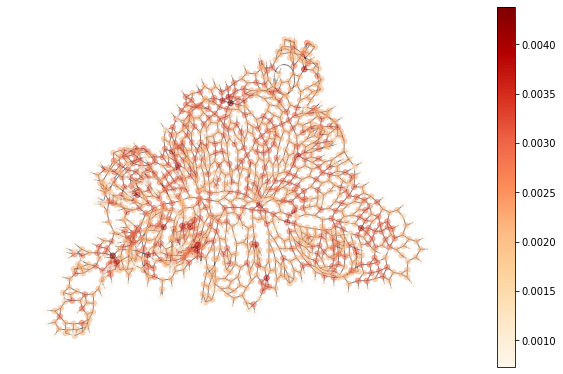

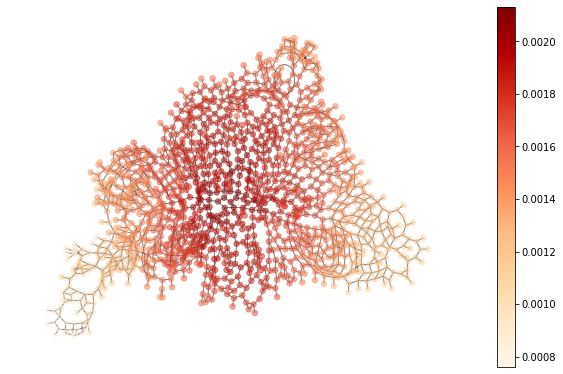

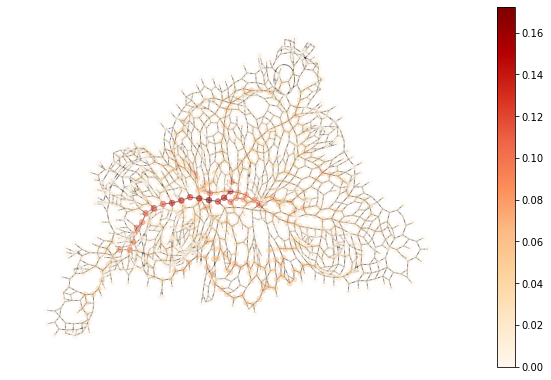

In [ ]:
# one uses the segment length as the edge length -- Weighted graphs

c_list = cal_centrality(G_zh, weight = 'weight') # calculate the desired centralities and return a list

plot_centrality(G_zh, c_list, 'Zurich Weighted Graph w/ ', node_size = 30) # plot the centrality measure

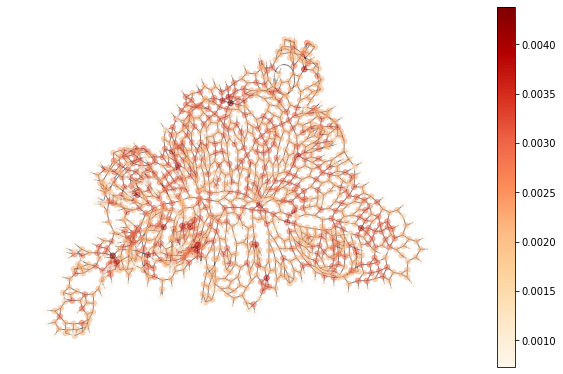

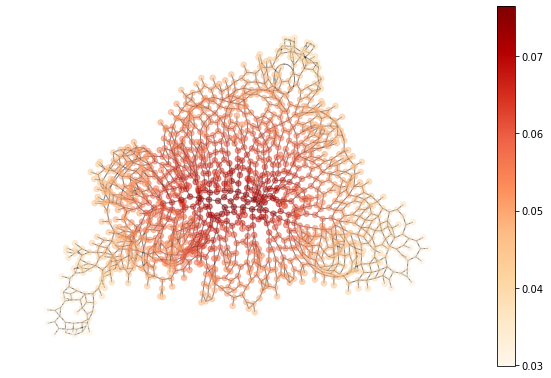

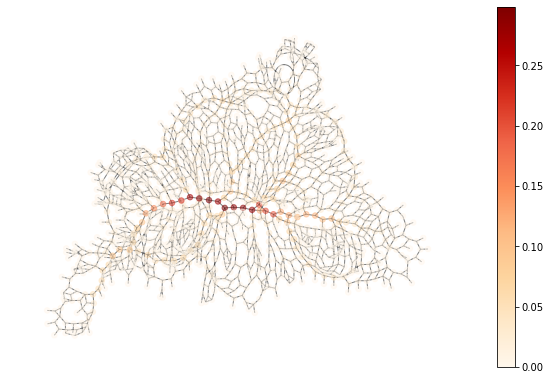

In [ ]:
# one only takes the topology of the network that treats all edge lengths as 1 -- unweighted graphs

c_list = cal_centrality(G_zh_unweighted) # calculate the desired centralities and return a list

plot_centrality(G_zh_unweighted, c_list, 'Zurich Unweighted Graph w/ ', node_size = 30) # plot the centrality measure

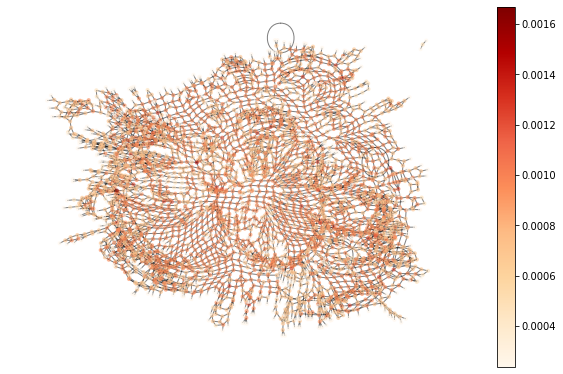

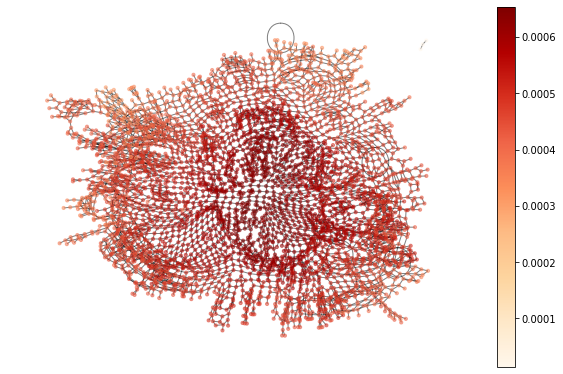

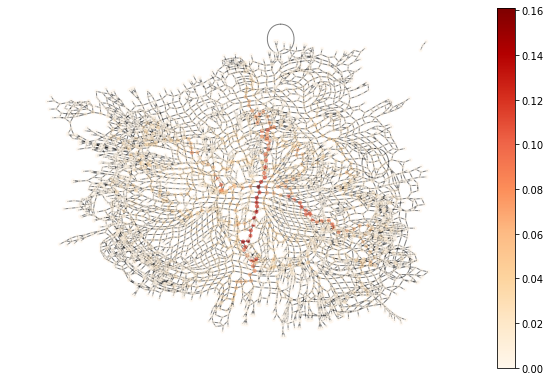

In [ ]:
# one uses the segment length as the edge length -- Weighted graphs

c_list = cal_centrality(G_ny, weight = 'weight',) # calculate the desired centralities and return a list

plot_centrality(G_ny, c_list, 'NewYork Weighted Graph w/ ', node_size = 10) # plot the centrality measure

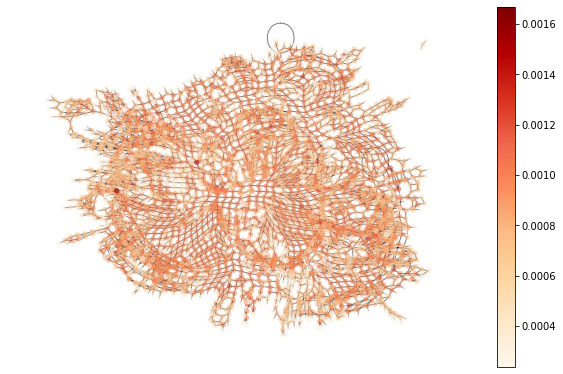

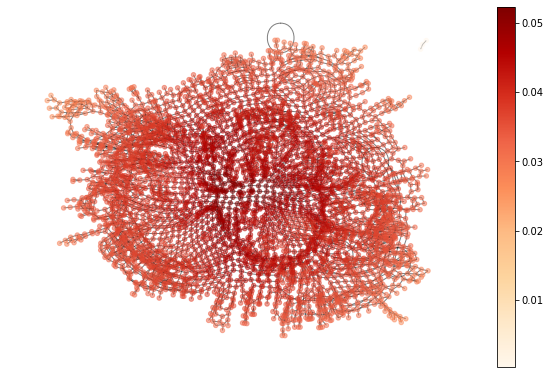

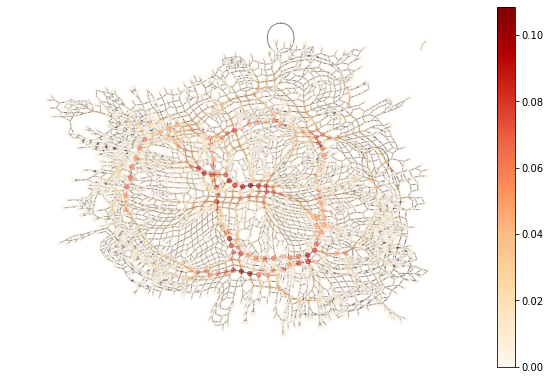

In [ ]:
# one only takes the topology of the network that treats all edge lengths as 1 -- unweighted graphs

c_list = cal_centrality(G_ny_unweighted) # calculate the desired centralities and return a list

plot_centrality(G_ny_unweighted, c_list, 'NewYork Unweighted Graph w/ ', node_size = 10) # plot the centrality measure

### Task 2: for the dual graphs, calculate one set of the centralities.
+ only takes the topology of the network that treats all edge lengths as 1

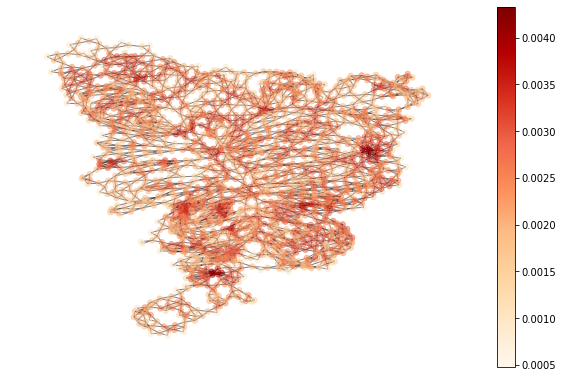

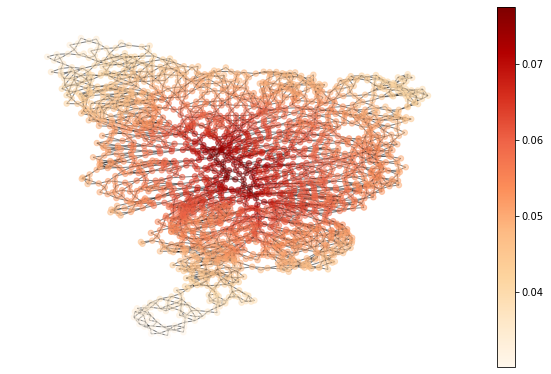

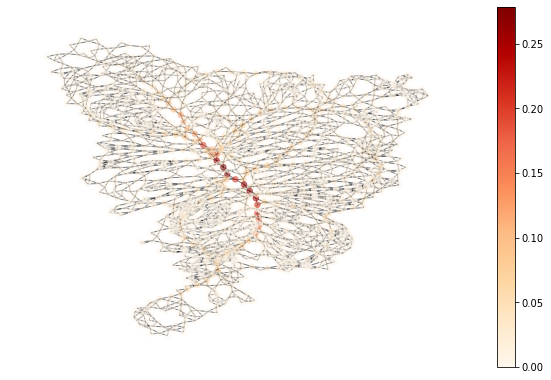

In [ ]:
# one only takes the topology of the network that treats all edge lengths as 1 -- unweighted graphs

c_list = cal_centrality(L_zh) # calculate the desired centralities and return a list

plot_centrality(L_zh, c_list, 'Zurich Dual Graph w/ ', node_size = 30) # plot the centrality measure

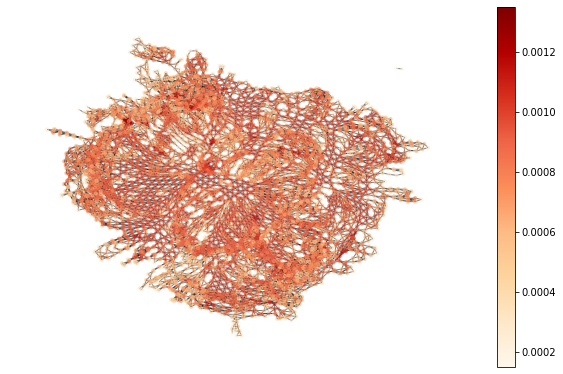

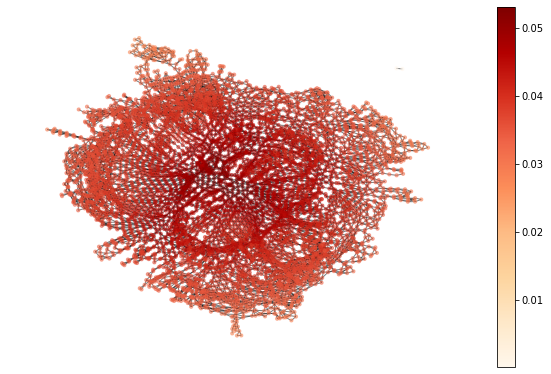

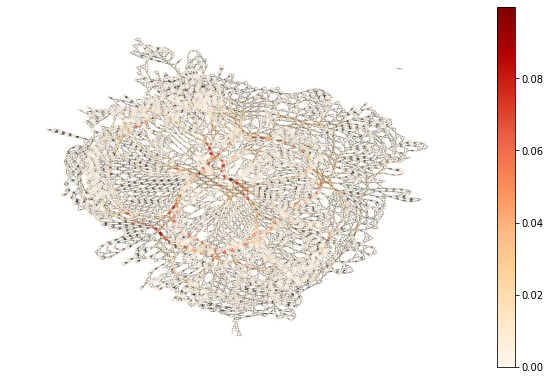

In [ ]:
# one only takes the topology of the network that treats all edge lengths as 1 -- unweighted graphs

c_list = cal_centrality(L_ny) # calculate the desired centralities and return a list

plot_centrality(L_ny, c_list, 'NewYork Dual Graph w/ ', node_size = 10) # plot the centrality measure

## 3.2.3 Visual and numerical analytics (30 pts)

+ Try to use maps, charts, and statistics to summarize the characteristics of centrality calculation results within the same graph, between the street graph and dual graph for the same city,
+ Try to use maps, charts, and statistics to summarize the characteristics of centrality calculation results within the same graph, between the same type of graphs of Zurich and New York.
+ Briefly discuss any knowledge you have from the analytics and address possible reasons for the two cities leading to similar or different patterns that you observe.

### Load shapfiles and coordinates

#### combine zurich graph with coordinates

In [7]:
# zurich weighted graph
weighted_edge_list_zh = zh.iloc[:, -3:].to_numpy() # load last 3 columns of the ZH df as (starting_node, ending_node, weight)
G_zh_weighted = nx.Graph()
G_zh_weighted.add_weighted_edges_from (weighted_edge_list_zh) # add weight

# Zurich unweighted graph
unweighted_edge_list_zh = weighted_edge_list_zh[:, :-1] # discard weight,'segment_lenth'
G_zh_unweighted = nx.Graph()
G_zh_unweighted.add_edges_from(unweighted_edge_list_zh)

In [ ]:
# Draw street map (graph w/ coordinates)
zh_nodes = pd.read_csv('zurich_nodes.csv') # read coordinates info of nodes
pos_zh = {n: (x, y) for n, y, x in zh_nodes.iloc[:, :3].to_numpy()} # synthesize node-coor pair (node: (x, y))

In [ ]:
# search for nodes to be removed (w/o coordinate info)
nodes_to_remove = []
for node in G_zh_weighted.nodes:
  if node not in zh_nodes.iloc[:, 0].to_numpy():
    nodes_to_remove.append(node)

# remove nodes without coordinates
G_zh_weighted.remove_nodes_from(nodes_to_remove)

In [ ]:
# Zurich
c_list_zh_coor = cal_centrality(G_zh_weighted, weight = 'weight') # calculate the desired centralities and return a list

#### combine NewYork graph with coordinate

In [ ]:
# NewYork weighted graph
weighted_edge_list_ny = ny.iloc[:, -3:].to_numpy() # load last 3 columns of the ny df as (starting_node, ending_node, weight)
G_ny_weighted = nx.Graph()
G_ny_weighted.add_weighted_edges_from (weighted_edge_list_ny) # add weight

# NewYork unweighted graph
unweighted_edge_list_ny = weighted_edge_list_ny[:, :-1] # discard weight,'segment_lenth'
G_ny_unweighted = nx.Graph()
G_ny_unweighted.add_edges_from(unweighted_edge_list_ny)

In [ ]:
# Draw street map (graph w/ coordinates)
ny_nodes = pd.read_csv('newyork_nodes.csv') # read coordinates info of nodes
pos_ny = {n: (x, y) for n, y, x in ny_nodes.iloc[:, :3].to_numpy()} # synthesize node-coor pair (node: (x, y))

# search for nodes to be removed (w/o coordinate info)
nodes_to_remove = []
for node in G_ny_weighted.nodes:
  if node not in ny_nodes.iloc[:, 0].to_numpy():
    nodes_to_remove.append(node)

# remove nodes without coordinates
G_ny_weighted.remove_nodes_from(nodes_to_remove)

In [ ]:
# NY centrality for nodes with coordinates info
c_list_ny_coor = cal_centrality(G_ny_weighted, weight = 'weight') # calculate the desired centralities and return a list

#### load shapfiles

In [ ]:
# load shapefile

# ZH
import geopandas as gpd
fp1 = ('zurich_node.shp')
zh_node = gpd.read_file(fp1)

fp2 = ('zurich_street.shp')
zh_street = gpd.read_file(fp2)

# NY
fp3 = ('newyork_nodes.shp')
ny_node = gpd.read_file(fp3)

fp4 = ('newyork_street.shp')
ny_street = gpd.read_file(fp4)

### calculate centrality using pre-defined function 'cal_centrality' in 3.2.2



In [ ]:
# calculate centrality using pre-defined function 'cal_centrality' in 3.2.2

# street graph centrality ZH weighted
c_list_streetgraph_zh = cal_centrality(G_zh, weight = 'weight') 
# street graph centrality ZH unweighted
c_list_streetgraph_zh_unweighted = cal_centrality(G_zh) 
# dual graph centrality ZH unweighted
c_list_dualgraph_zh = cal_centrality(L_zh) 

# street graph centrality ny weighted
c_list_streetgraph_ny = cal_centrality(G_ny, weight = 'weight') 
# street graph centrality ny unweighted
c_list_streetgraph_ny_unweighted = cal_centrality(G_ny) 
# dual graph centrality ny unweighted
c_list_dualgraph_ny = cal_centrality(L_ny) 

### Task 1:
+ Try to use **maps** to summarize the characteristics of centrality calculation results within the same graph, between the **street graph** and **dual graph** for the same city,

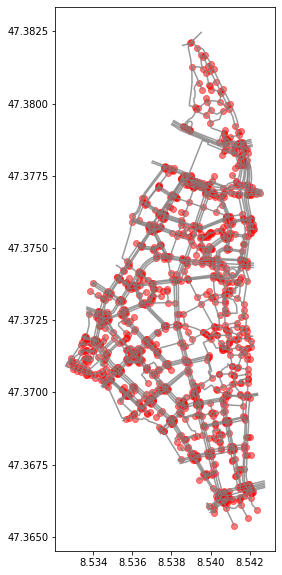

In [ ]:
# plot zh street map
ax1 = zh_node.plot(figsize=(10,10), color="red", alpha = 0.5)
zh_street.plot(ax=ax1, edgecolor = 'grey', alpha =0.8)
#plt.grid()

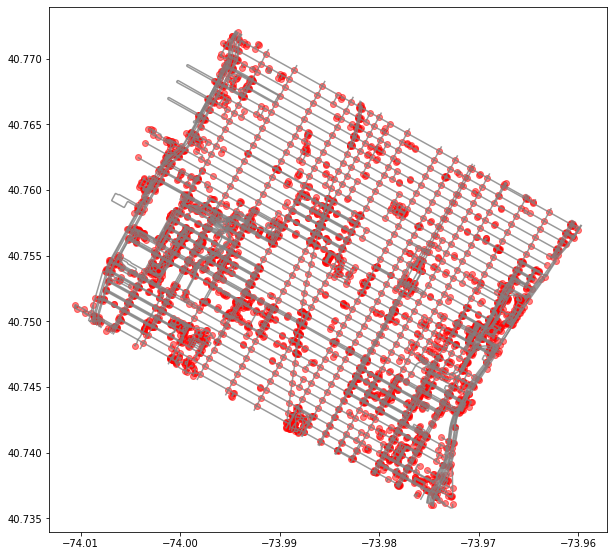

In [ ]:
# plot ny street map
ax1 = ny_node.plot(figsize=(10,10), color="red", alpha = 0.5)
ny_street.plot(ax=ax1, edgecolor = 'grey', alpha =0.8)
#plt.grid()

In [60]:
# define a function to visualize the centrality measures as colored nodes of a graph
def plot_centrality(g, centrality, cmap = None, title = None, node_size = None, pos = None, ax = None, figsize = None):

  if ax == None:
    plt.figure(figsize=(8,5) if figsize == None else figsize)
  else:
    ax.set_title(title)

  # formulate colormap
  cmap = cmap 
  vmin = min(centrality) # minimal color value
  vmax = max(centrality) # maximal color value

  # config colorbar
  sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin = vmin, vmax=vmax))
  sm._A = []
  plt.colorbar(sm, ax = ax)

  # draw map w/ centrality coloring
  return draw_nx(g, pos = pos, figsize = figsize, title = f'{title}', ax = ax, node_color = centrality, cmap = cmap, vmin = vmin, vmax = vmax, node_size = node_size)



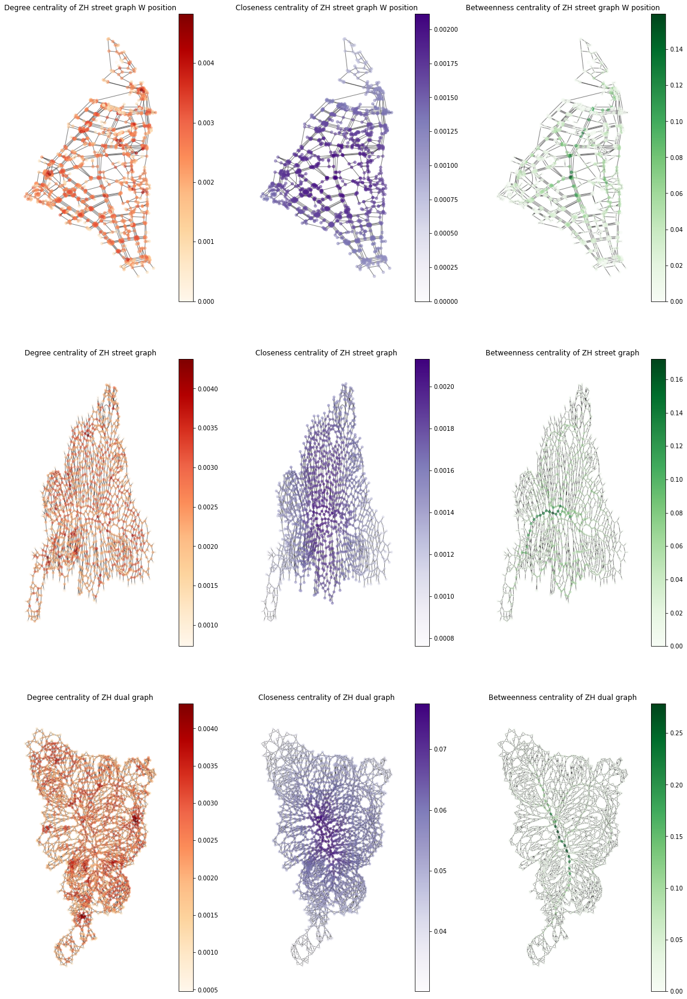

In [ ]:
# plot centralities of zurich

# define subplot
fig, ax = plt.subplots(3,3, figsize = (20,30))
#plt.subplots_adjust(hspace = 0.04)

# d_c, c_c, b_c of Zuirch weighted street graph with the coordinates information
plot_centrality(G_zh_weighted, c_list_zh_coor[0], pos = pos_zh, cmap = plt.cm.OrRd, title = 'Degree centrality of ZH street graph W position', ax = ax[0,0], node_size= 20)
plot_centrality(G_zh_weighted, c_list_zh_coor[1], pos = pos_zh, cmap = plt.cm.Purples, title = 'Closeness centrality of ZH street graph W position', ax = ax[0,1], node_size= 20)
plot_centrality(G_zh_weighted, c_list_zh_coor[2], pos = pos_zh, cmap = plt.cm.Greens, title = 'Betweenness centrality of ZH street graph W position', ax = ax[0,2], node_size= 20)

# d_c, c_c, b_c of Zuirch weighted street graph without positioning
plot_centrality(G_zh_weighted, c_list_streetgraph_zh[0], cmap = plt.cm.OrRd, title = 'Degree centrality of ZH street graph', ax = ax[1,0], node_size= 15)
plot_centrality(G_zh_weighted, c_list_streetgraph_zh[1], cmap = plt.cm.Purples, title = 'Closeness centrality of ZH street graph', ax = ax[1,1], node_size= 15)
plot_centrality(G_zh_weighted, c_list_streetgraph_zh[2], cmap = plt.cm.Greens, title = 'Betweenness centrality of ZH street graph', ax = ax[1,2], node_size= 15)


# d_c, c_c, b_c of Zuirch unweighted dual graph
plot_centrality(L_zh, c_list_dualgraph_zh[0], cmap = plt.cm.OrRd, title = 'Degree centrality of ZH dual graph', ax = ax[2,0], node_size= 15)
plot_centrality(L_zh, c_list_dualgraph_zh[1], cmap = plt.cm.Purples, title = 'Closeness centrality of ZH dual graph', ax = ax[2,1], node_size= 15)
plot_centrality(L_zh, c_list_dualgraph_zh[2], cmap = plt.cm.Greens, title = 'Betweenness centrality of ZH dual graph', ax = ax[2,2], node_size= 15)


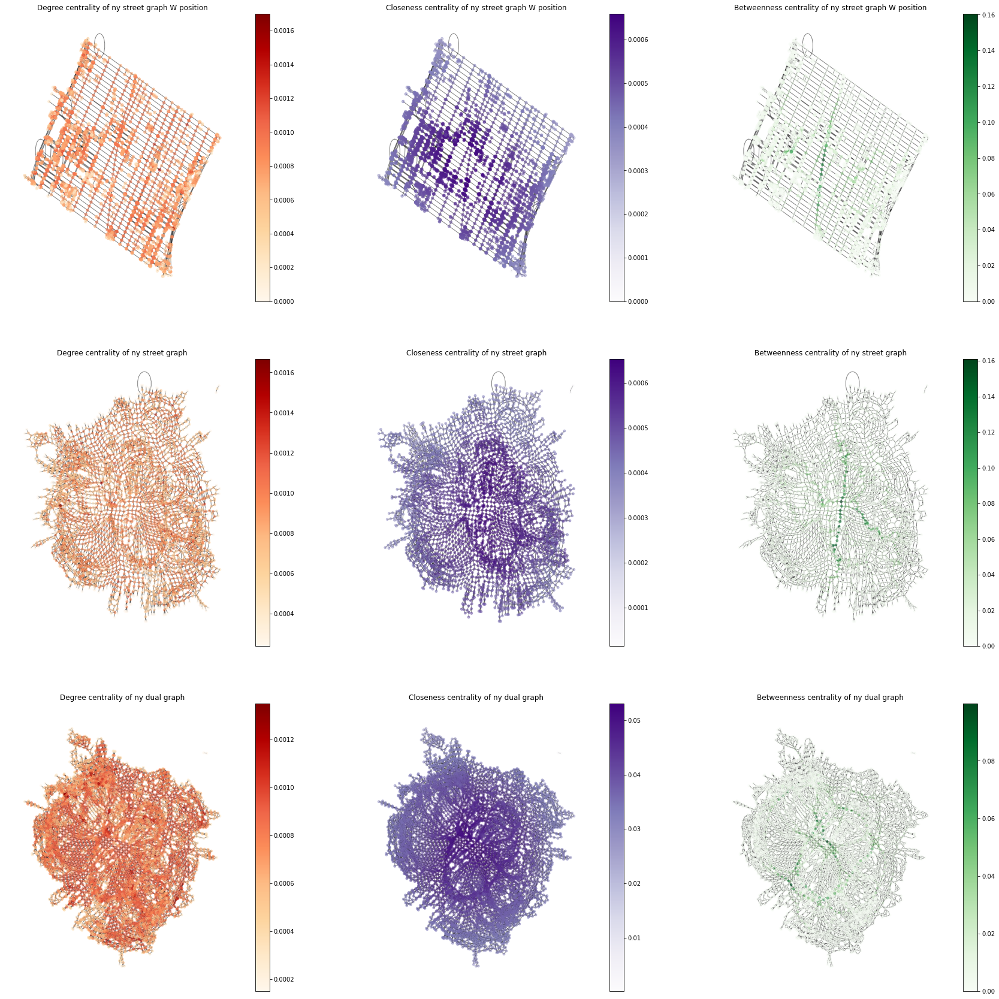

In [ ]:
# plot centralities of NewYork

# define subplot
fig, ax = plt.subplots(3,3, figsize = (30,30))
#plt.subplots_adjust(hspace = 0.4)

# d_c, c_c, b_c of Zuirch weighted street graph with the coordinates information
plot_centrality(G_ny_weighted, c_list_ny_coor[0], pos = pos_ny, cmap = plt.cm.OrRd, title = 'Degree centrality of ny street graph W position', ax = ax[0,0], node_size= 20)
plot_centrality(G_ny_weighted, c_list_ny_coor[1], pos = pos_ny, cmap = plt.cm.Purples, title = 'Closeness centrality of ny street graph W position', ax = ax[0,1], node_size= 20)
plot_centrality(G_ny_weighted, c_list_ny_coor[2], pos = pos_ny, cmap = plt.cm.Greens, title = 'Betweenness centrality of ny street graph W position', ax = ax[0,2], node_size= 20)

# d_c, c_c, b_c of Zuirch weighted street graph without positioning
plot_centrality(G_ny, c_list_streetgraph_ny[0], cmap = plt.cm.OrRd, title = 'Degree centrality of ny street graph', ax = ax[1,0], node_size= 10)
plot_centrality(G_ny, c_list_streetgraph_ny[1], cmap = plt.cm.Purples, title = 'Closeness centrality of ny street graph', ax = ax[1,1], node_size= 10)
plot_centrality(G_ny, c_list_streetgraph_ny[2], cmap = plt.cm.Greens, title = 'Betweenness centrality of ny street graph', ax = ax[1,2], node_size= 10)

# d_c, c_c, b_c of Zuirch unweighted dual graph
plot_centrality(L_ny, c_list_dualgraph_ny[0], cmap = plt.cm.OrRd, title = 'Degree centrality of ny dual graph', ax = ax[2,0], node_size= 10)
plot_centrality(L_ny, c_list_dualgraph_ny[1], cmap = plt.cm.Purples, title = 'Closeness centrality of ny dual graph', ax = ax[2,1], node_size= 10)
plot_centrality(L_ny, c_list_dualgraph_ny[2], cmap = plt.cm.Greens, title = 'Betweenness centrality of ny dual graph', ax = ax[2,2], node_size= 10)


### Task 2:
+ Try to use **statistics** to summarize the characteristics of centrality calculation results within the same graph, between the **street graph** and **dual graph** for the same city,

In [22]:
# define a funtion to draw the cumulative distribution of centrality

def cdf_centrality (centrality_result, title = None, ax = None, label = None):
  c = np.array(centrality_result)
  count, bins_count = np.histogram(c, bins= 100)
  pdf = count/ sum(count) # probability density function
  cdf = np.cumsum(pdf) # cumulative distribution function
  if ax == None:
    plt.plot(bins_count[1:], cdf, label = None)
    plt.legend()
    plt.title(title)
  else:
    ax.plot(bins_count[1:], cdf, label = label)
    ax.legend()
    ax.set_title(title)

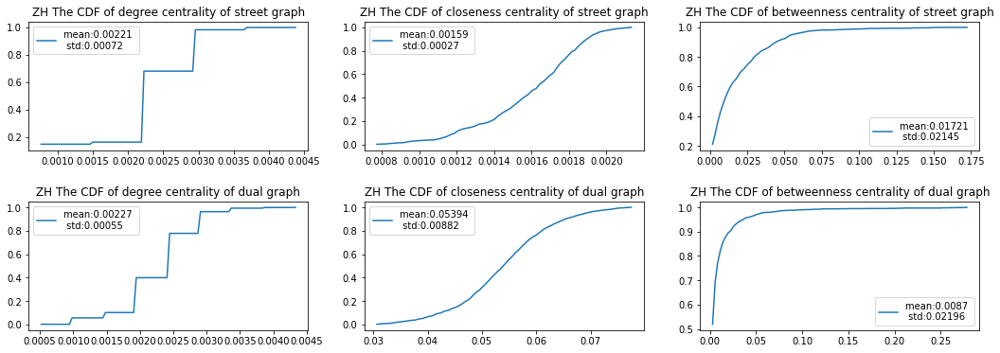

In [29]:
# plot cdf of zurich
fig, ax = plt.subplots(2,3, figsize = (18, 6))
plt.subplots_adjust(hspace = 0.4, wspace = 0.2)

# weighted street graph
cdf_centrality(c_list_streetgraph_zh[0], title = 'ZH The CDF of degree centrality of street graph', ax = ax[0,0], \
               label= f'mean:{round(np.mean(c_list_streetgraph_zh[0]),5)} \n std:{round(np.std(c_list_streetgraph_zh[0]),5)}')

cdf_centrality(c_list_streetgraph_zh[1], title = 'ZH The CDF of closeness centrality of street graph', ax = ax[0,1],\
               label= f'mean:{round(np.mean(c_list_streetgraph_zh[1]),5)} \n std:{round(np.std(c_list_streetgraph_zh[1]),5)}')

cdf_centrality(c_list_streetgraph_zh[2],title = 'ZH The CDF of betweenness centrality of street graph', ax = ax[0,2],\
                   label= f'mean:{round(np.mean(c_list_streetgraph_zh[2]),5)} \n std:{round(np.std(c_list_streetgraph_zh[2]),5)}')

# dual graph
cdf_centrality(c_list_dualgraph_zh[0], title = 'ZH The CDF of degree centrality of dual graph', ax = ax[1,0],\
               label= f'mean:{round(np.mean(c_list_dualgraph_zh[0]),5)} \n std:{round(np.std(c_list_dualgraph_zh[0]),5)}')

cdf_centrality(c_list_dualgraph_zh[1], title = 'ZH The CDF of closeness centrality of dual graph', ax = ax[1,1],\
               label= f'mean:{round(np.mean(c_list_dualgraph_zh[1]),5)} \n std:{round(np.std(c_list_dualgraph_zh[1]),5)}')

b = cdf_centrality(c_list_dualgraph_zh[2],title = 'ZH The CDF of betweenness centrality of dual graph', ax = ax[1,2],\
                   label= f'mean:{round(np.mean(c_list_dualgraph_zh[2]),5)} \n std:{round(np.std(c_list_dualgraph_zh[2]),5)}')

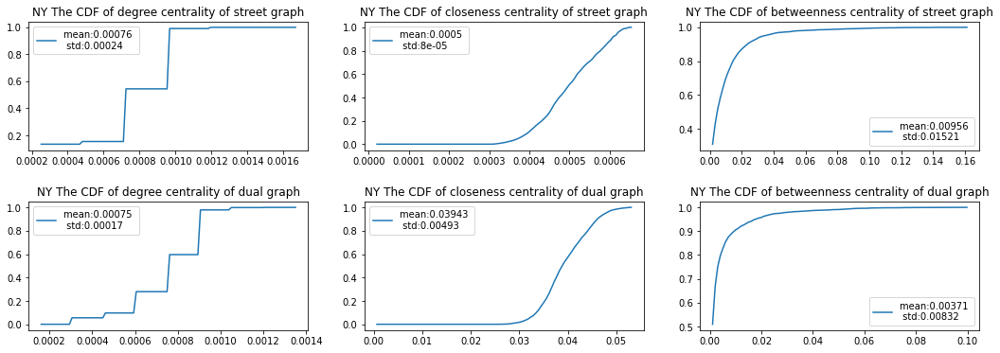

In [52]:
# plot cdf of NewYork
fig, ax = plt.subplots(2,3, figsize = (18, 6))
plt.subplots_adjust(hspace = 0.4)

# weighted graph
cdf_centrality(c_list_streetgraph_ny[0], title = 'NY The CDF of degree centrality of street graph', ax = ax[0,0], \
               label= f'mean:{round(np.mean(c_list_streetgraph_ny[0]),5)} \n std:{round(np.std(c_list_streetgraph_ny[0]),5)}')

cdf_centrality(c_list_streetgraph_ny[1], title = 'NY The CDF of closeness centrality of street graph', ax = ax[0,1],\
               label= f'mean:{round(np.mean(c_list_streetgraph_ny[1]),5)} \n std:{round(np.std(c_list_streetgraph_ny[1]),5)}')

cdf_centrality(c_list_streetgraph_ny[2],title = 'NY The CDF of betweenness centrality of street graph', ax = ax[0,2],\
                   label= f'mean:{round(np.mean(c_list_streetgraph_ny[2]),5)} \n std:{round(np.std(c_list_streetgraph_ny[2]),5)}')

# dual graph
cdf_centrality(c_list_dualgraph_ny[0], title = 'NY The CDF of degree centrality of dual graph', ax = ax[1,0],\
               label= f'mean:{round(np.mean(c_list_dualgraph_ny[0]),5)} \n std:{round(np.std(c_list_dualgraph_ny[0]),5)}')

cdf_centrality(c_list_dualgraph_ny[1], title = 'NY The CDF of closeness centrality of dual graph', ax = ax[1,1],\
               label= f'mean:{round(np.mean(c_list_dualgraph_ny[1]),5)} \n std:{round(np.std(c_list_dualgraph_ny[1]),5)}')

cdf_centrality(c_list_dualgraph_ny[2],title = 'NY The CDF of betweenness centrality of dual graph', ax = ax[1,2],\
                   label= f'mean:{round(np.mean(c_list_dualgraph_ny[2]),5)} \n std:{round(np.std(c_list_dualgraph_ny[2]),5)}')

### Task3:
+ Try to use **charts** to summarize the characteristics of centrality calculation results within the same graph, between the **street graph** and **dual graph** for the same city,

In [30]:
# define a funtion to draw the cumulative distribution of centrality

def hist_centrality (centrality_result, title = None, ax = None):
  if ax == None:
    plt.hist(centrality_result, bins = 30, alpha = 0.8)
    plt.title(title)
  else:
    ax.hist(centrality_result, bins = 30, alpha = 0.8)
    ax.set_title(title)
  

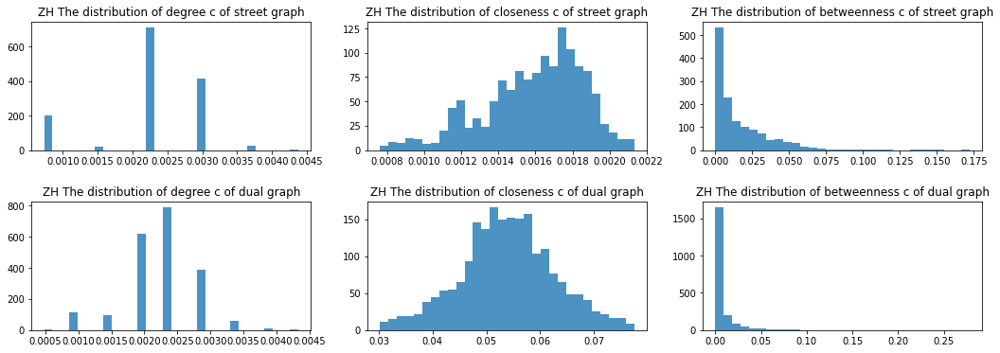

In [31]:
# plot distribution of zurich
fig, ax = plt.subplots(2,3, figsize = (18, 6))
plt.subplots_adjust(hspace = 0.4)

hist_centrality(c_list_streetgraph_zh[0], title = 'ZH The distribution of degree c of street graph', ax = ax[0,0])
hist_centrality(c_list_streetgraph_zh[1], title = 'ZH The distribution of closeness c of street graph', ax = ax[0,1])
hist_centrality(c_list_streetgraph_zh[2],title = 'ZH The distribution of betweenness c of street graph', ax = ax[0,2])

hist_centrality(c_list_dualgraph_zh[0], title = 'ZH The distribution of degree c of dual graph', ax = ax[1,0])
hist_centrality(c_list_dualgraph_zh[1], title = 'ZH The distribution of closeness c of dual graph', ax = ax[1,1])
hist_centrality(c_list_dualgraph_zh[2],title = 'ZH The distribution of betweenness c of dual graph', ax = ax[1,2])

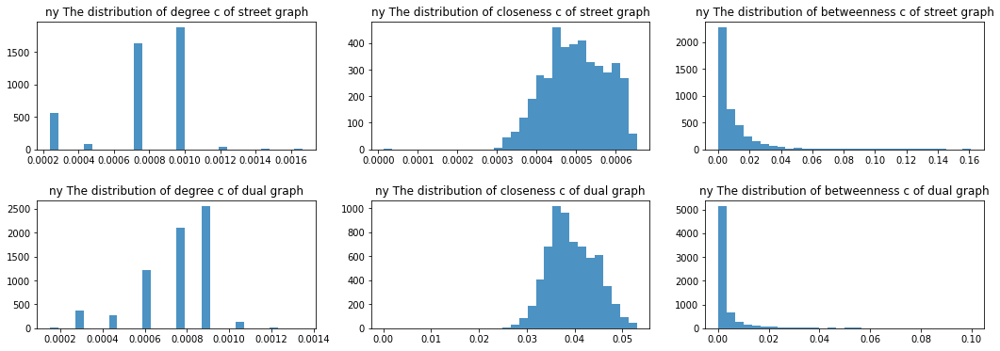

In [53]:
# plot distribution of NY
fig, ax = plt.subplots(2,3, figsize = (18, 6))
plt.subplots_adjust(hspace = 0.4)

hist_centrality(c_list_streetgraph_ny[0], title = 'ny The distribution of degree c of street graph', ax = ax[0,0])
hist_centrality(c_list_streetgraph_ny[1], title = 'ny The distribution of closeness c of street graph', ax = ax[0,1])
hist_centrality(c_list_streetgraph_ny[2],title = 'ny The distribution of betweenness c of street graph', ax = ax[0,2])

hist_centrality(c_list_dualgraph_ny[0], title = 'ny The distribution of degree c of dual graph', ax = ax[1,0])
hist_centrality(c_list_dualgraph_ny[1], title = 'ny The distribution of closeness c of dual graph', ax = ax[1,1])
hist_centrality(c_list_dualgraph_ny[2],title = 'ny The distribution of betweenness c of dual graph', ax = ax[1,2])

#### comparison between ZH and NY

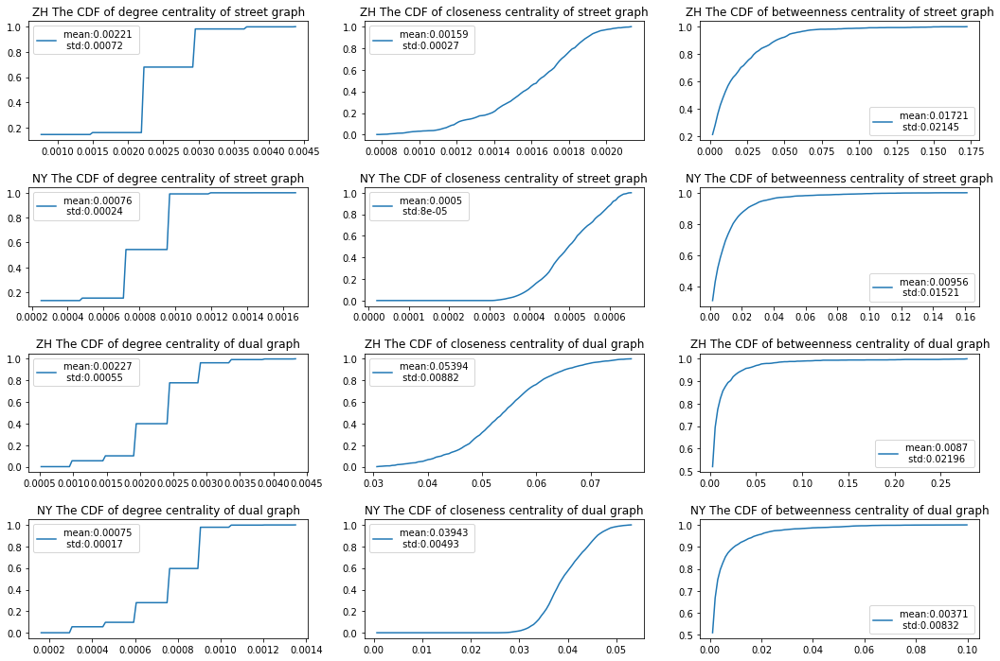

In [57]:
# statistics street graph


# plot cdf of zurich
fig, ax = plt.subplots(4,3, figsize = (18, 12))
plt.subplots_adjust(hspace = 0.4, wspace = 0.2)

# zurich
cdf_centrality(c_list_streetgraph_zh[0], title = 'ZH The CDF of degree centrality of street graph', ax = ax[0,0], \
               label= f'mean:{round(np.mean(c_list_streetgraph_zh[0]),5)} \n std:{round(np.std(c_list_streetgraph_zh[0]),5)}')

cdf_centrality(c_list_streetgraph_zh[1], title = 'ZH The CDF of closeness centrality of street graph', ax = ax[0,1],\
               label= f'mean:{round(np.mean(c_list_streetgraph_zh[1]),5)} \n std:{round(np.std(c_list_streetgraph_zh[1]),5)}')

cdf_centrality(c_list_streetgraph_zh[2],title = 'ZH The CDF of betweenness centrality of street graph', ax = ax[0,2],\
                   label= f'mean:{round(np.mean(c_list_streetgraph_zh[2]),5)} \n std:{round(np.std(c_list_streetgraph_zh[2]),5)}')

# weighted graph
cdf_centrality(c_list_streetgraph_ny[0], title = 'NY The CDF of degree centrality of street graph', ax = ax[1,0], \
               label= f'mean:{round(np.mean(c_list_streetgraph_ny[0]),5)} \n std:{round(np.std(c_list_streetgraph_ny[0]),5)}')

cdf_centrality(c_list_streetgraph_ny[1], title = 'NY The CDF of closeness centrality of street graph', ax = ax[1,1],\
               label= f'mean:{round(np.mean(c_list_streetgraph_ny[1]),5)} \n std:{round(np.std(c_list_streetgraph_ny[1]),5)}')

cdf_centrality(c_list_streetgraph_ny[2],title = 'NY The CDF of betweenness centrality of street graph', ax = ax[1,2],\
                   label= f'mean:{round(np.mean(c_list_streetgraph_ny[2]),5)} \n std:{round(np.std(c_list_streetgraph_ny[2]),5)}')



# statistics dual graph

# dual graph
cdf_centrality(c_list_dualgraph_zh[0], title = 'ZH The CDF of degree centrality of dual graph', ax = ax[2,0],\
               label= f'mean:{round(np.mean(c_list_dualgraph_zh[0]),5)} \n std:{round(np.std(c_list_dualgraph_zh[0]),5)}')

cdf_centrality(c_list_dualgraph_zh[1], title = 'ZH The CDF of closeness centrality of dual graph', ax = ax[2,1],\
               label= f'mean:{round(np.mean(c_list_dualgraph_zh[1]),5)} \n std:{round(np.std(c_list_dualgraph_zh[1]),5)}')

b = cdf_centrality(c_list_dualgraph_zh[2],title = 'ZH The CDF of betweenness centrality of dual graph', ax = ax[2,2],\
                   label= f'mean:{round(np.mean(c_list_dualgraph_zh[2]),5)} \n std:{round(np.std(c_list_dualgraph_zh[2]),5)}')


# dual graph
cdf_centrality(c_list_dualgraph_ny[0], title = 'NY The CDF of degree centrality of dual graph', ax = ax[3,0],\
               label= f'mean:{round(np.mean(c_list_dualgraph_ny[0]),5)} \n std:{round(np.std(c_list_dualgraph_ny[0]),5)}')

cdf_centrality(c_list_dualgraph_ny[1], title = 'NY The CDF of closeness centrality of dual graph', ax = ax[3,1],\
               label= f'mean:{round(np.mean(c_list_dualgraph_ny[1]),5)} \n std:{round(np.std(c_list_dualgraph_ny[1]),5)}')

cdf_centrality(c_list_dualgraph_ny[2],title = 'NY The CDF of betweenness centrality of dual graph', ax = ax[3,2],\
                   label= f'mean:{round(np.mean(c_list_dualgraph_ny[2]),5)} \n std:{round(np.std(c_list_dualgraph_ny[2]),5)}')

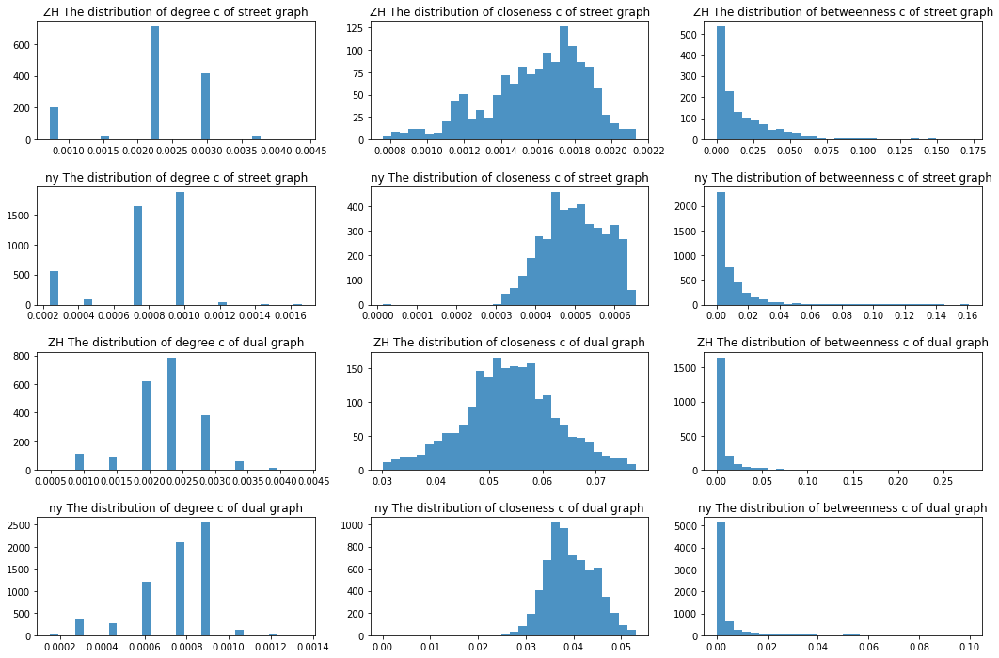

In [59]:
# charts street graph


# plot cdf of zurich
fig, ax = plt.subplots(4,3, figsize = (18, 12))
plt.subplots_adjust(hspace = 0.4, wspace = 0.2)

# street graph
hist_centrality(c_list_streetgraph_zh[0], title = 'ZH The distribution of degree c of street graph', ax = ax[0,0])
hist_centrality(c_list_streetgraph_zh[1], title = 'ZH The distribution of closeness c of street graph', ax = ax[0,1])
hist_centrality(c_list_streetgraph_zh[2],title = 'ZH The distribution of betweenness c of street graph', ax = ax[0,2])

hist_centrality(c_list_streetgraph_ny[0], title = 'ny The distribution of degree c of street graph', ax = ax[1,0])
hist_centrality(c_list_streetgraph_ny[1], title = 'ny The distribution of closeness c of street graph', ax = ax[1,1])
hist_centrality(c_list_streetgraph_ny[2],title = 'ny The distribution of betweenness c of street graph', ax = ax[1,2])


# dual graph
hist_centrality(c_list_dualgraph_zh[0], title = 'ZH The distribution of degree c of dual graph', ax = ax[2,0])
hist_centrality(c_list_dualgraph_zh[1], title = 'ZH The distribution of closeness c of dual graph', ax = ax[2,1])
hist_centrality(c_list_dualgraph_zh[2],title = 'ZH The distribution of betweenness c of dual graph', ax = ax[2,2])

hist_centrality(c_list_dualgraph_ny[0], title = 'ny The distribution of degree c of dual graph', ax = ax[3,0])
hist_centrality(c_list_dualgraph_ny[1], title = 'ny The distribution of closeness c of dual graph', ax = ax[3,1])
hist_centrality(c_list_dualgraph_ny[2],title = 'ny The distribution of betweenness c of dual graph', ax = ax[3,2])

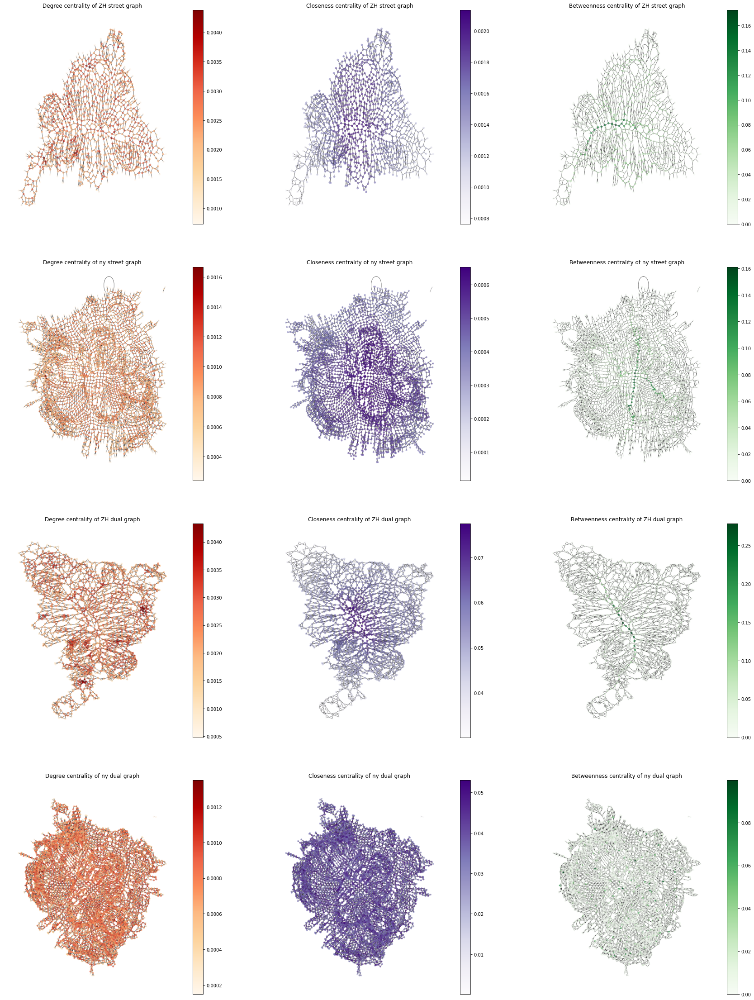

In [61]:
# plot centralities of zurich

# define subplot
fig, ax = plt.subplots(4,3, figsize = (30,40))
#plt.subplots_adjust(hspace = 0.04)

# d_c, c_c, b_c of Zuirch weighted street graph without positioning
plot_centrality(G_zh_weighted, c_list_streetgraph_zh[0], cmap = plt.cm.OrRd, title = 'Degree centrality of ZH street graph', ax = ax[0,0], node_size= 15)
plot_centrality(G_zh_weighted, c_list_streetgraph_zh[1], cmap = plt.cm.Purples, title = 'Closeness centrality of ZH street graph', ax = ax[0,1], node_size= 15)
plot_centrality(G_zh_weighted, c_list_streetgraph_zh[2], cmap = plt.cm.Greens, title = 'Betweenness centrality of ZH street graph', ax = ax[0,2], node_size= 15)


# d_c, c_c, b_c of Zuirch weighted street graph without positioning
plot_centrality(G_ny, c_list_streetgraph_ny[0], cmap = plt.cm.OrRd, title = 'Degree centrality of ny street graph', ax = ax[1,0], node_size= 10)
plot_centrality(G_ny, c_list_streetgraph_ny[1], cmap = plt.cm.Purples, title = 'Closeness centrality of ny street graph', ax = ax[1,1], node_size= 10)
plot_centrality(G_ny, c_list_streetgraph_ny[2], cmap = plt.cm.Greens, title = 'Betweenness centrality of ny street graph', ax = ax[1,2], node_size= 10)


# d_c, c_c, b_c of Zuirch unweighted dual graph
plot_centrality(L_zh, c_list_dualgraph_zh[0], cmap = plt.cm.OrRd, title = 'Degree centrality of ZH dual graph', ax = ax[2,0], node_size= 15)
plot_centrality(L_zh, c_list_dualgraph_zh[1], cmap = plt.cm.Purples, title = 'Closeness centrality of ZH dual graph', ax = ax[2,1], node_size= 15)
plot_centrality(L_zh, c_list_dualgraph_zh[2], cmap = plt.cm.Greens, title = 'Betweenness centrality of ZH dual graph', ax = ax[2,2], node_size= 15)

# d_c, c_c, b_c of Zuirch unweighted dual graph
plot_centrality(L_ny, c_list_dualgraph_ny[0], cmap = plt.cm.OrRd, title = 'Degree centrality of ny dual graph', ax = ax[3,0], node_size= 10)
plot_centrality(L_ny, c_list_dualgraph_ny[1], cmap = plt.cm.Purples, title = 'Closeness centrality of ny dual graph', ax = ax[3,1], node_size= 10)
plot_centrality(L_ny, c_list_dualgraph_ny[2], cmap = plt.cm.Greens, title = 'Betweenness centrality of ny dual graph', ax = ax[3,2], node_size= 10)

Conclusion:
Comparing street graph and dual graph:

•	Geographic features are retained in street graph but lost in dual graph, which only keep the topology features of the road. Dual graph allows for discovering hidden structural properties of road networks, such as the hierarchy of roads and the true connectivity of the road network.

•	Street graph and dual graph reveal similar patterns for the road network for both cities. Degree and closeness centrality is larger in dual graph. Betweenness centrality is almost the same in dual graph and street graph, both of which show high betweenness in several nodes. Those could be the main roads that connect different part of the city.

Comparing Zurich and New York:

•	The road network pattern of New York is grid. The road network pattern in Zurich is irregular. The possible reasons of the difference between the two cities could be of landscape, the number of populations, and mainly transportation methods. As we all know Zurich is mountainous with no more than 500 thousand people. While Manhattan is a flat island with a population of over 1.5 million. 

•	For the street graphs, the average degree and closeness centralities are higher in Zurich, which indicates that the intersections of the street can be influenced more easily, and each intersection are closer in Zurich. However, the average betweenness centrality in Zurich is smaller, which indicate that there are less roads in New York connecting different parts of the city.

•	For the dual graph, the degree centralities are almost the same for both cities. The closeness centralities are higher, but the betweenness is smaller in in New York. The results are similar to street graphs
